# Proyek pertama: Telecom customer churn
- **Nama:** Halim Sajidi
- **Email:** halimsajidi14@gmail.com
- **ID Dicoding:** halimsajidi
- **Link:** https://www.kaggle.com/datasets/shilongzhuang/telecom-customer-churn-by-maven-analytics?resource=download

## Library

In [9]:
pip install optuna

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, recall_score, f1_score, accuracy_score, precision_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
import optuna
import lightgbm as lgb

## Data Wrangling

### Gathering Data

In [11]:
df = pd.read_csv('telecom_customer_churn.csv')

In [12]:
data = pd.read_csv('telecom_customer_churn.csv')

In [13]:
df

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20,No,0,La Mesa,91941,32.759327,-116.997260,0,...,Credit Card,55.15,742.90,0.00,0,606.84,1349.74,Stayed,NaN,NaN
7039,9992-RRAMN,Male,40,Yes,0,Riverbank,95367,37.734971,-120.954271,1,...,Bank Withdrawal,85.10,1873.70,0.00,0,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22,No,0,Elk,95432,39.108252,-123.645121,0,...,Credit Card,50.30,92.75,0.00,0,37.24,129.99,Joined,NaN,NaN
7041,9993-LHIEB,Male,21,Yes,0,Solana Beach,92075,33.001813,-117.263628,5,...,Credit Card,67.85,4627.65,0.00,0,142.04,4769.69,Stayed,NaN,NaN


Dataset telecom customer churn memiliki 38 kolom dan 7043 baris

### Assessing Data

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              3166 non-null   objec

In [15]:
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [16]:
df.isnull().sum()

,0
Customer ID,0
Gender,0
Age,0
Married,0
Number of Dependents,0
City,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0


In [17]:
print("Jumlah duplikasi: ", df.duplicated().sum())

Jumlah duplikasi:  0


**select categorical data**

In [18]:
df_cat = df.select_dtypes(include="object")
cat_col = df_cat.columns
df_cat.head(5)

,Customer ID,Gender,Married,City,Offer,Phone Service,Multiple Lines,Internet Service,Internet Type,Online Security,...,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,Yes,Frazier Park,NaN,Yes,No,Yes,Cable,No,...,Yes,No,No,Yes,One Year,Yes,Credit Card,Stayed,NaN,NaN
1,0003-MKNFE,Male,No,Glendale,NaN,Yes,Yes,Yes,Cable,No,...,No,Yes,Yes,No,Month-to-Month,No,Credit Card,Stayed,NaN,NaN
2,0004-TLHLJ,Male,No,Costa Mesa,Offer E,Yes,No,Yes,Fiber Optic,No,...,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,Yes,Martinez,Offer D,Yes,No,Yes,Fiber Optic,No,...,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,Yes,Camarillo,NaN,Yes,No,Yes,Fiber Optic,No,...,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,Churned,Dissatisfaction,Network reliability


In [19]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Customer ID             7043 non-null   object
 1   Gender                  7043 non-null   object
 2   Married                 7043 non-null   object
 3   City                    7043 non-null   object
 4   Offer                   3166 non-null   object
 5   Phone Service           7043 non-null   object
 6   Multiple Lines          6361 non-null   object
 7   Internet Service        7043 non-null   object
 8   Internet Type           5517 non-null   object
 9   Online Security         5517 non-null   object
 10  Online Backup           5517 non-null   object
 11  Device Protection Plan  5517 non-null   object
 12  Premium Tech Support    5517 non-null   object
 13  Streaming TV            5517 non-null   object
 14  Streaming Movies        5517 non-null   object
 15  Stre

**Select numerical data**

In [20]:
df_num = df.select_dtypes(include=["int64", "float64"])
num_col = df_num.columns
df_num

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
0,37,0,93225,34.827662,-118.999073,2,9,42.39,16.0,65.60,593.30,0.00,0,381.51,974.81
1,46,0,91206,34.162515,-118.203869,0,9,10.69,10.0,-4.00,542.40,38.33,10,96.21,610.28
2,50,0,92627,33.645672,-117.922613,0,4,33.65,30.0,73.90,280.85,0.00,0,134.60,415.45
3,78,0,94553,38.014457,-122.115432,1,13,27.82,4.0,98.00,1237.85,0.00,0,361.66,1599.51
4,75,0,93010,34.227846,-119.079903,3,3,7.38,11.0,83.90,267.40,0.00,0,22.14,289.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,20,0,91941,32.759327,-116.997260,0,13,46.68,59.0,55.15,742.90,0.00,0,606.84,1349.74
7039,40,0,95367,37.734971,-120.954271,1,22,16.20,17.0,85.10,1873.70,0.00,0,356.40,2230.10
7040,22,0,95432,39.108252,-123.645121,0,2,18.62,51.0,50.30,92.75,0.00,0,37.24,129.99
7041,21,0,92075,33.001813,-117.263628,5,67,2.12,58.0,67.85,4627.65,0.00,0,142.04,4769.69


## Menangani Missing Value dan Outlier

### Missing Value

**Numerikal missing value**

membersihkan nan value pada setiap kolom numerik

In [21]:
df[num_col].isna().sum()

,0
Age,0
Number of Dependents,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0
Tenure in Months,0
Avg Monthly Long Distance Charges,682
Avg Monthly GB Download,1526
Monthly Charge,0


In [22]:
for column in num_col:
  if df[column].isnull().any():
    df[column].fillna(df[column].mean(), inplace=True)

<ipython-input-22-2069f89e2a27>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(df[column].mean(), inplace=True)


In [23]:
df[num_col].isna().sum()

,0
Age,0
Number of Dependents,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0
Tenure in Months,0
Avg Monthly Long Distance Charges,0
Avg Monthly GB Download,0
Monthly Charge,0


**Kategorikal missing value**

membersihkan nan value pada setiap kolom numerik

In [24]:
df[cat_col].isna().sum()

,0
Customer ID,0
Gender,0
Married,0
City,0
Offer,3877
Phone Service,0
Multiple Lines,682
Internet Service,0
Internet Type,1526
Online Security,1526


In [25]:
for column in cat_col:
    if df[column].isnull().any():
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)

<ipython-input-25-8c0ddc1b5291>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)


In [26]:
df[cat_col].isna().sum()

,0
Customer ID,0
Gender,0
Married,0
City,0
Offer,0
Phone Service,0
Multiple Lines,0
Internet Service,0
Internet Type,0
Online Security,0


### Outlier

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

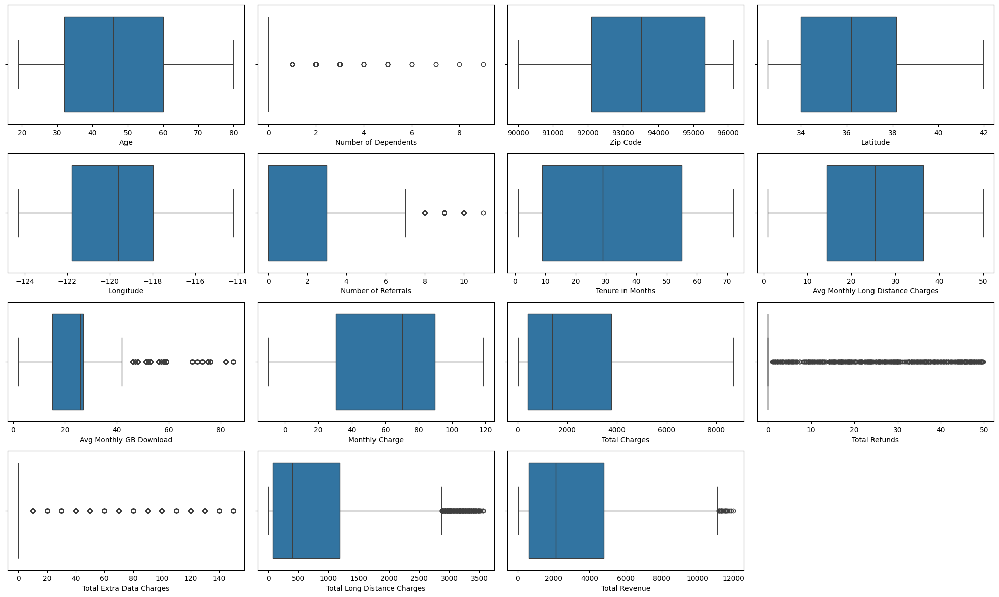

In [27]:
plt.figure(figsize=(20, 12))

# Calculate the number of rows and columns needed for the subplots
num_rows = 4
num_cols = 4

for i, column in enumerate(num_col, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=df, x=df[column])
    plt.tight_layout()

In [28]:
Q1 = df[num_col].quantile(0.25)
Q3 = df[num_col].quantile(0.75)
IQR = Q3 - Q1

# Create a mask for outliers
outliers_mask = (df[num_col] < (Q1 - 1.5 * IQR)) | (df[num_col] > (Q3 + 1.5 * IQR))

# Replace outliers with the mean of each column
for column in num_col:
    mean_value = df[column].mean()
    df.loc[outliers_mask[column], column] = mean_value

df_clean = df.copy()

<ipython-input-28-2f0ef3804476>:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '46.50972596904728' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[outliers_mask[column], column] = mean_value
<ipython-input-28-2f0ef3804476>:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.4686923186142269' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[outliers_mask[column], column] = mean_value
<ipython-input-28-2f0ef3804476>:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '93486.07056651995' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[outliers_mask[column], column] = mean_value
<ipython-input-28-2f0ef3804

Bagian ini didapatkan outlier pada dataset dan solusi yang dilakukan adalah dengan mengubah outlier tersebut menjadi nan yang kemudian nilai nan akan diisi dengan rata-rata (mean)

In [29]:
df_clean

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37.0,Yes,0.0,Frazier Park,93225.0,34.827662,-118.999073,2.0,...,Credit Card,65.60,593.30,0.000000,0.000000,381.51,974.81,Stayed,Competitor,Competitor had better devices
1,0003-MKNFE,Male,46.0,No,0.0,Glendale,91206.0,34.162515,-118.203869,0.0,...,Credit Card,-4.00,542.40,1.962182,6.860713,96.21,610.28,Stayed,Competitor,Competitor had better devices
2,0004-TLHLJ,Male,50.0,No,0.0,Costa Mesa,92627.0,33.645672,-117.922613,0.0,...,Bank Withdrawal,73.90,280.85,0.000000,0.000000,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78.0,Yes,0.0,Martinez,94553.0,38.014457,-122.115432,1.0,...,Bank Withdrawal,98.00,1237.85,0.000000,0.000000,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75.0,Yes,0.0,Camarillo,93010.0,34.227846,-119.079903,3.0,...,Credit Card,83.90,267.40,0.000000,0.000000,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20.0,No,0.0,La Mesa,91941.0,32.759327,-116.997260,0.0,...,Credit Card,55.15,742.90,0.000000,0.000000,606.84,1349.74,Stayed,Competitor,Competitor had better devices
7039,9992-RRAMN,Male,40.0,Yes,0.0,Riverbank,95367.0,37.734971,-120.954271,1.0,...,Bank Withdrawal,85.10,1873.70,0.000000,0.000000,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22.0,No,0.0,Elk,95432.0,39.108252,-123.645121,0.0,...,Credit Card,50.30,92.75,0.000000,0.000000,37.24,129.99,Joined,Competitor,Competitor had better devices
7041,9993-LHIEB,Male,21.0,Yes,0.0,Solana Beach,92075.0,33.001813,-117.263628,5.0,...,Credit Card,67.85,4627.65,0.000000,0.000000,142.04,4769.69,Stayed,Competitor,Competitor had better devices


## Exploratory Data Analysis (EDA)

### Univariate Analysis

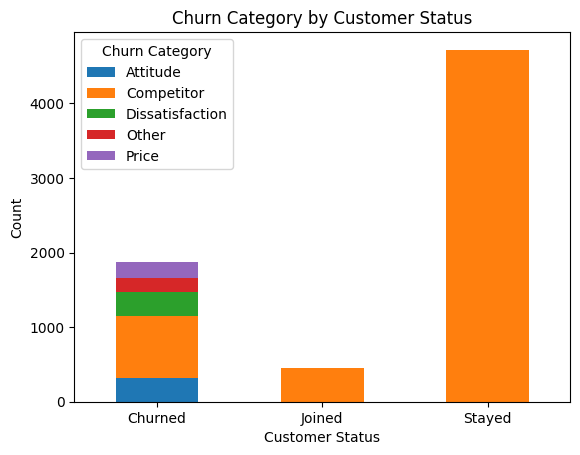

In [30]:
df_clean.groupby(['Customer Status', 'Churn Category']).size().unstack().plot(kind='bar', stacked=True)
plt.title('Churn Category by Customer Status')
plt.xticks(rotation=0)
plt.ylabel('Count')
plt.show()


Grafik ini menunjukkan bahwa sebagian besar pelanggan tetap setia menggunakan layanan, sementara pelanggan yang churn terutama disebabkan oleh kompetitor, diikuti oleh ketidakpuasan dan sikap pelanggan.

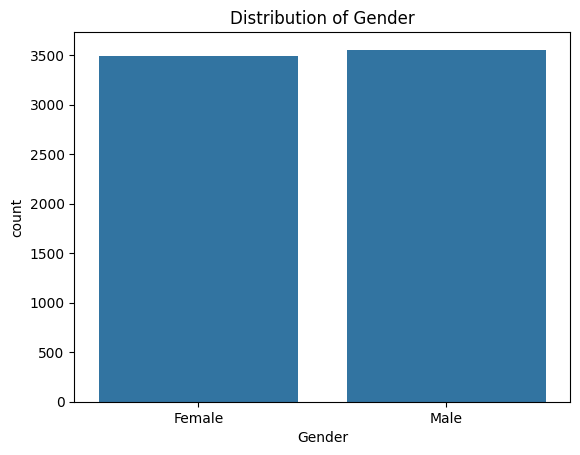

In [31]:
sns.countplot(data=df_clean, x='Gender')
plt.title('Distribution of Gender')
plt.show()


Grafik di atas menunjukkan bahwa tidak ada perbedaan signifikan antara pelanggan berdasarkan gender.

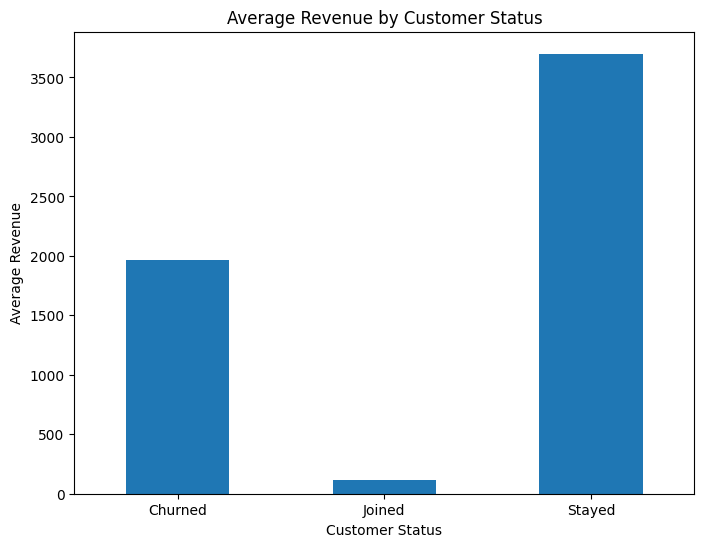

In [38]:
total_revenue_by_status = df_clean.groupby('Customer Status')['Total Revenue'].mean()

# Create a bar plot
plt.figure(figsize=(8, 6))
total_revenue_by_status.plot(kind='bar')
plt.title('Average Revenue by Customer Status')
plt.xlabel('Customer Status')
plt.ylabel('Average Revenue')
plt.xticks(rotation=0)  # Make x-axis labels horizontal
plt.show()

Grafik ini menunjukkan bahwa rata-rata pendapatan pelanggan yang stayed jauh lebih tinggi dibandingkan dengan pelanggan yang churn.

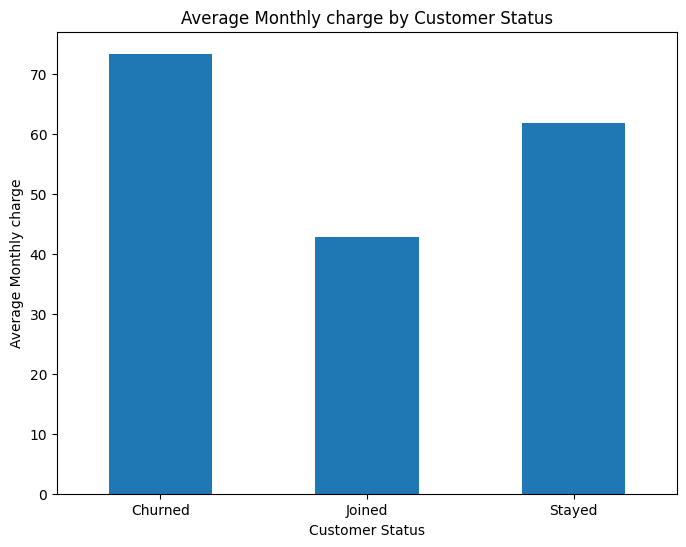

In [40]:
total_Monthly_charge_by_status = df_clean.groupby('Customer Status')['Monthly Charge'].mean()

# Create a bar plot
plt.figure(figsize=(8, 6))
total_Monthly_charge_by_status.plot(kind='bar')
plt.title('Average Monthly charge by Customer Status')
plt.xlabel('Customer Status')
plt.ylabel('Average Monthly charge')
plt.xticks(rotation=0)  # Make x-axis labels horizontal
plt.show()

Grafik di atas menunjukkan bahwa pelanggan dengan biaya bulanan lebih tinggi cenderung mengalami churn.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


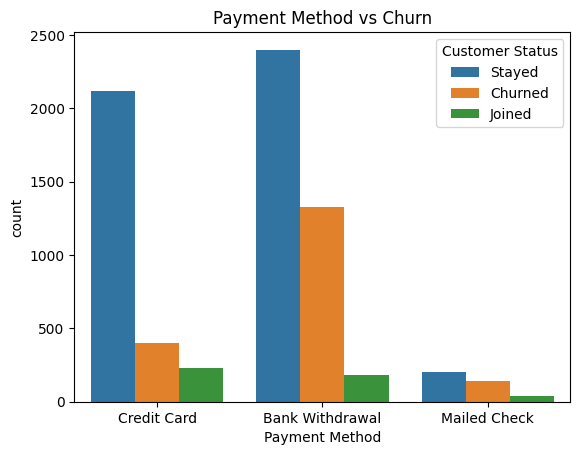

In [33]:
sns.countplot(x='Payment Method', hue='Customer Status', data=df)
plt.title('Payment Method vs Churn')
plt.show()


Berdasarkan grafik di atas, terlihat bahwa metode pembayaran bank withdrawal, diikuti oleh credit card, merupakan metode pembayaran yang paling diminati. Namun, pada pembayaran credit card selisih pengguna yang stayed dengan churned terbilang besar, sehingga dapat dikatakan bahwa metode ini adalah yang paling efektif.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


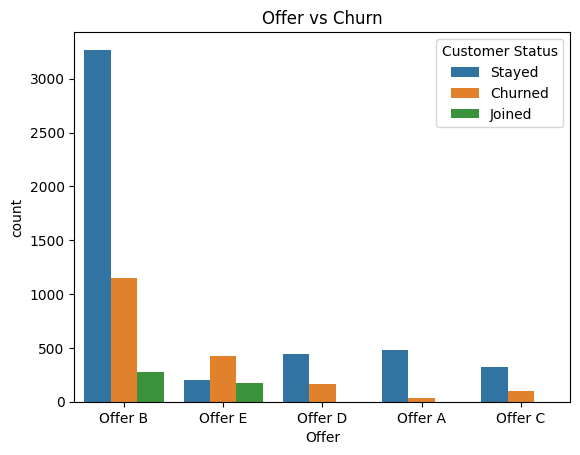

In [45]:
sns.countplot(x='Offer', hue='Customer Status', data=df)
plt.title('Offer vs Churn')
plt.show()

Terlihat bahwa pelanggan yang menerima "Offer B" cenderung lebih banyak memilih untuk tetap bertahan (Stayed) dibandingkan dengan penawaran lainnya.

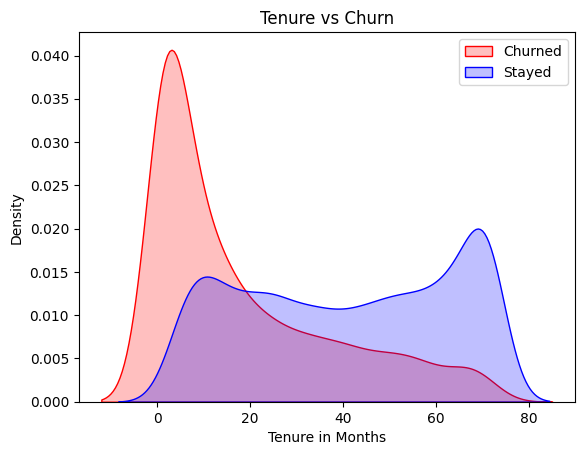

In [50]:
sns.kdeplot(df_clean[df_clean['Customer Status'] == 'Churned']['Tenure in Months'], label='Churned', fill=True, color='red')
sns.kdeplot(df_clean[df_clean['Customer Status'] == 'Stayed']['Tenure in Months'], label='Stayed', fill=True, color='blue')
plt.title('Tenure vs Churn')
plt.legend()
plt.show()

Berdasarkan grafik di atas dapat diketahui bahwa pelanggan dengan masa berlangganan yang pendek lebih cenderung churn dibandingkan dengan pelanggan dengan masa berlangganan lebih lama.

### Multivariate

**Pairplot**

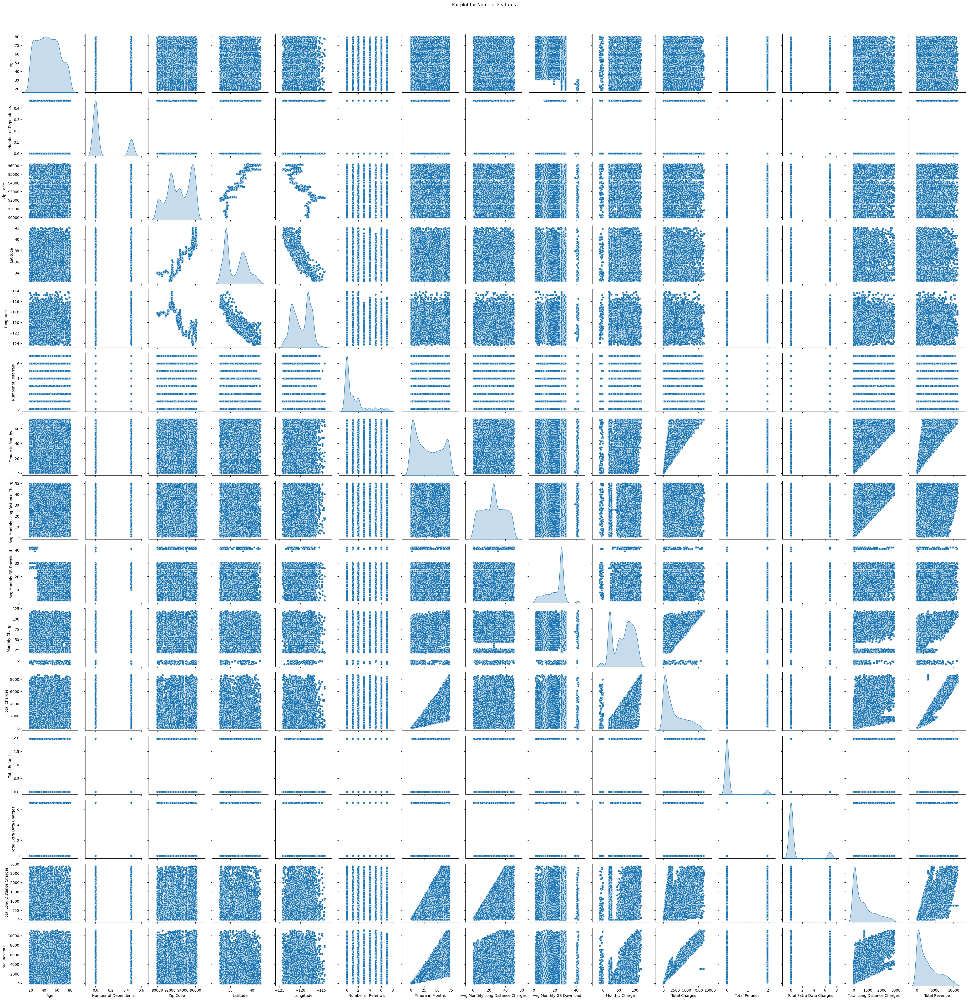

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Buat pairplot untuk kolom numerik
sns.pairplot(df_clean[num_col], diag_kind='kde')
plt.suptitle('Pairplot for Numeric Features', y=1.02)
plt.show()


**Heatmap**

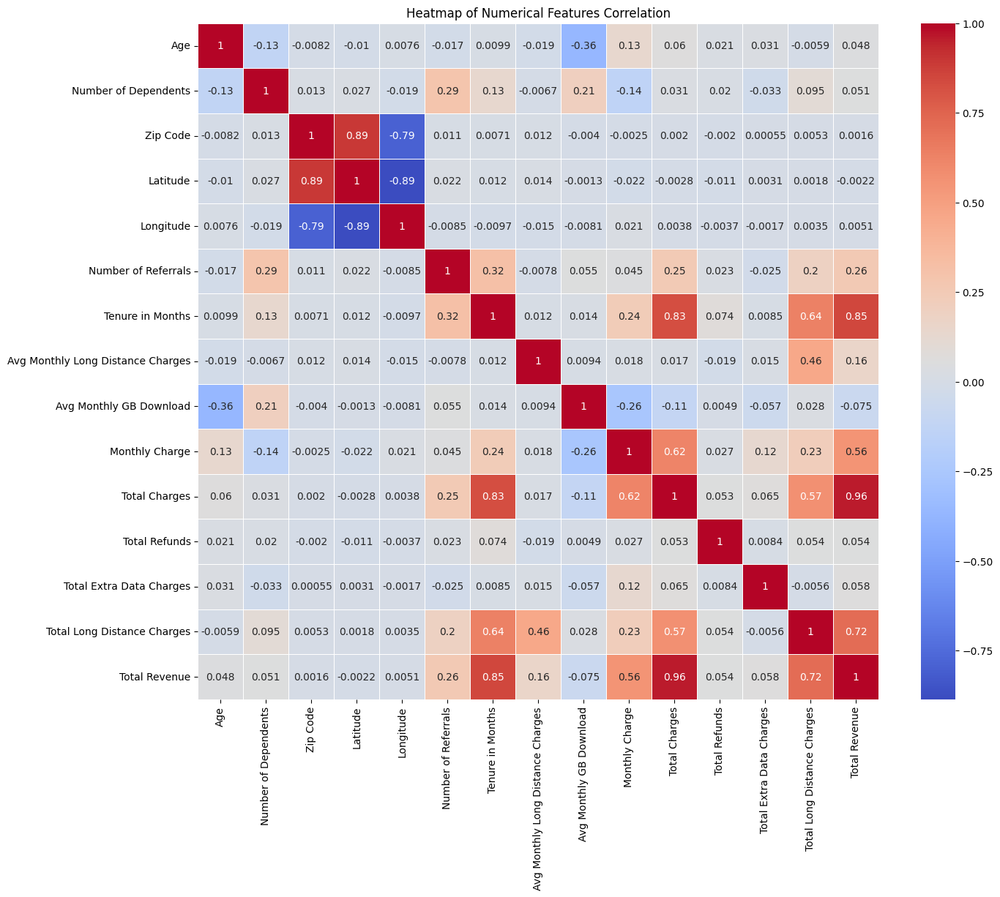

In [61]:
# Hitung korelasi antar kolom numerik
corr_matrix = df_clean[num_col].corr()

# Buat heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Numerical Features Correlation')
plt.show()

**countplot**

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

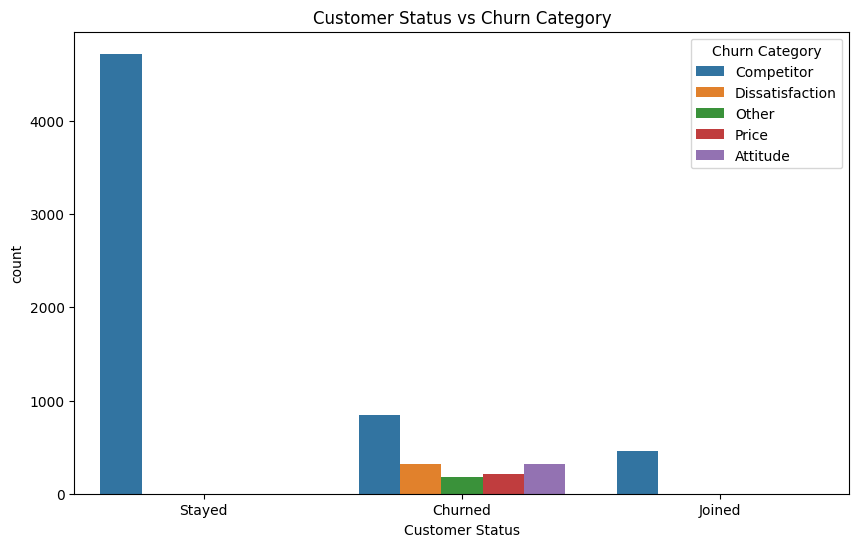

In [62]:
# Buat countplot untuk distribusi 'Customer Status' berdasarkan 'Churn Category'
plt.figure(figsize=(10, 6))
sns.countplot(data=df_clean, x='Customer Status', hue='Churn Category')
plt.title('Customer Status vs Churn Category')
plt.show()


**boxplot**

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


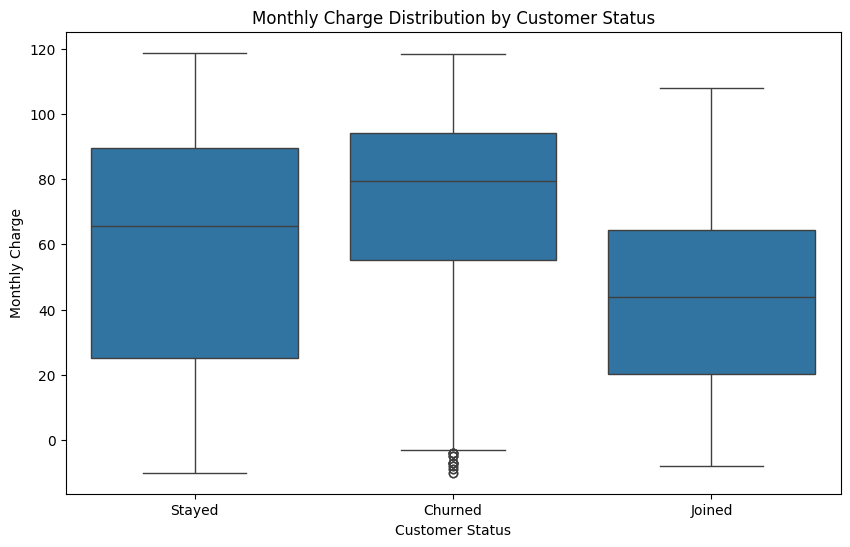

In [63]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_clean, x='Customer Status', y='Monthly Charge')
plt.title('Monthly Charge Distribution by Customer Status')
plt.show()

## Data Preparation

### Encoding Data

Pada tahap ini dilakukan encoding menggunakan label encoder, bertujuan agar data dapat diproses pada saat pengembangan model machine learning.

In [ ]:
le = LabelEncoder()

for column in cat_col:
    df_clean[column] = le.fit_transform(df_clean[column])

df_clean


,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0,0,37.0,1,0.0,346,93225.0,34.827662,-118.999073,2.0,...,1,65.60,593.30,0.000000,0.000000,381.51,974.81,2,1,2
1,1,1,46.0,0,0.0,368,91206.0,34.162515,-118.203869,0.0,...,1,-4.00,542.40,1.962182,6.860713,96.21,610.28,2,1,2
2,2,1,50.0,0,0.0,222,92627.0,33.645672,-117.922613,0.0,...,0,73.90,280.85,0.000000,0.000000,134.60,415.45,0,1,2
3,3,1,78.0,1,0.0,587,94553.0,38.014457,-122.115432,1.0,...,0,98.00,1237.85,0.000000,0.000000,361.66,1599.51,0,2,18
4,4,0,75.0,1,0.0,139,93010.0,34.227846,-119.079903,3.0,...,1,83.90,267.40,0.000000,0.000000,22.14,289.54,0,2,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,7038,0,20.0,0,0.0,490,91941.0,32.759327,-116.997260,0.0,...,1,55.15,742.90,0.000000,0.000000,606.84,1349.74,2,1,2
7039,7039,1,40.0,1,0.0,827,95367.0,37.734971,-120.954271,1.0,...,0,85.10,1873.70,0.000000,0.000000,356.40,2230.10,0,2,18
7040,7040,1,22.0,0,0.0,296,95432.0,39.108252,-123.645121,0.0,...,1,50.30,92.75,0.000000,0.000000,37.24,129.99,1,1,2
7041,7041,1,21.0,1,0.0,930,92075.0,33.001813,-117.263628,5.0,...,1,67.85,4627.65,0.000000,0.000000,142.04,4769.69,2,1,2


### splitting data

Pembagian data dilakukan agar mendapatkan dataset train dan juga test dengan proporsi 80% dan 20%

In [ ]:
X = df_clean.drop(columns=['Customer ID','Customer Status'])
y = df_clean['Customer Status']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('X_train', X_train.shape)  #Printing the X_train Features Shape
print('y_train', y_train.shape)  #Printing the y_train Labels Shape
print('X_test', X_test.shape)    #Printing the X_test Features Shape
print('y_test', y_test.shape)    #Printing the y_test Labels  Shape

X_train (5634, 36)
y_train (5634,)
X_test (1409, 36)
y_test (1409,)


## Machine Learning Model

### LGBM

In [ ]:
# Initialize the LGBM Classifier
lgbm_model = LGBMClassifier(random_state=42)

# Train the model
lgbm_model.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMClassifier(random_state=42)

In [ ]:
# Predicting the X_test
pred = lgbm_model.predict(X_test)

# Testing the model accuracy with different parameters
acc = accuracy_score(y_test, pred)  # Getting the Accuracy Score
f1 = f1_score(y_test, pred, average='macro')  # Getting the F1 Score for multiclass
rec = recall_score(y_test, pred, average='macro')  # Getting the Recall Score for multiclass
prec = precision_score(y_test, pred, average='macro')  # Getting the Precision Score for multiclass
cm_lgbm = confusion_matrix(y_test, pred)  # Getting the confusion Matrix

# Defining a DataFrame
results = pd.DataFrame([['LGBM', acc, f1, rec, prec]],
                           columns=['Model', 'Accuracy_Score', 'F1_Score', 'Recall_Score', 'Precision_Score'])

# Printing the Model Results with different Metrics
results

,Model,Accuracy_Score,F1_Score,Recall_Score,Precision_Score
0,LGBM,0.951739,0.914557,0.923587,0.911283


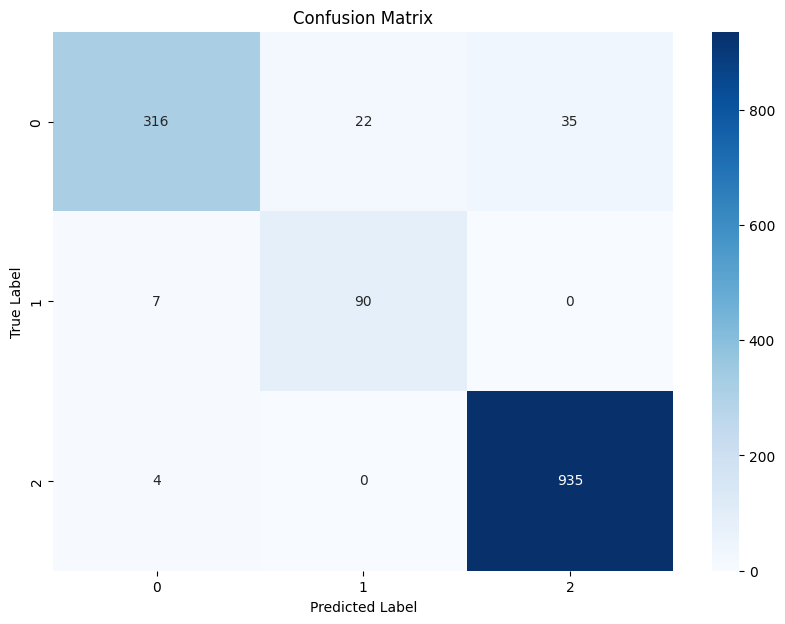

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(cm_lgbm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Random Forest

In [ ]:
#Building the model
clf_rf = RandomForestClassifier(random_state=42)#Creating the Random Forest Classifier Model
clf_rf.fit(X_train, y_train)                   #Training the Model with X_train & y_train

RandomForestClassifier(random_state=42)

In [ ]:
# Membuat prediksi pada X_test
pred = clf_rf.predict(X_test)

# Menghitung metrik evaluasi
acc = accuracy_score(y_test, pred)  # Menghitung Accuracy
f1 = f1_score(y_test, pred, average='macro')  # Menghitung F1 Score (multiclass)
rec = recall_score(y_test, pred, average='macro')  # Menghitung Recall (multiclass)
prec = precision_score(y_test, pred, average='macro')  # Menghitung Precision (multiclass)
cm_rf = confusion_matrix(y_test, pred)  # Menghitung Confusion Matrix

# Menyimpan hasil evaluasi dalam DataFrame
model_results = pd.DataFrame([['Random Forest', acc, f1, rec, prec]],
                             columns=['Model', 'Accuracy_Score', 'F1_Score', 'Recall_Score', 'Precision_Score'])

# Menggabungkan hasil evaluasi ke dalam DataFrame `results`
results = pd.concat([results, model_results], ignore_index=True)

# Menampilkan hasil
results

,Model,Accuracy_Score,F1_Score,Recall_Score,Precision_Score
0,LGBM,0.951739,0.914557,0.923587,0.911283
1,Random Forest,0.946771,0.909232,0.914250,0.910265


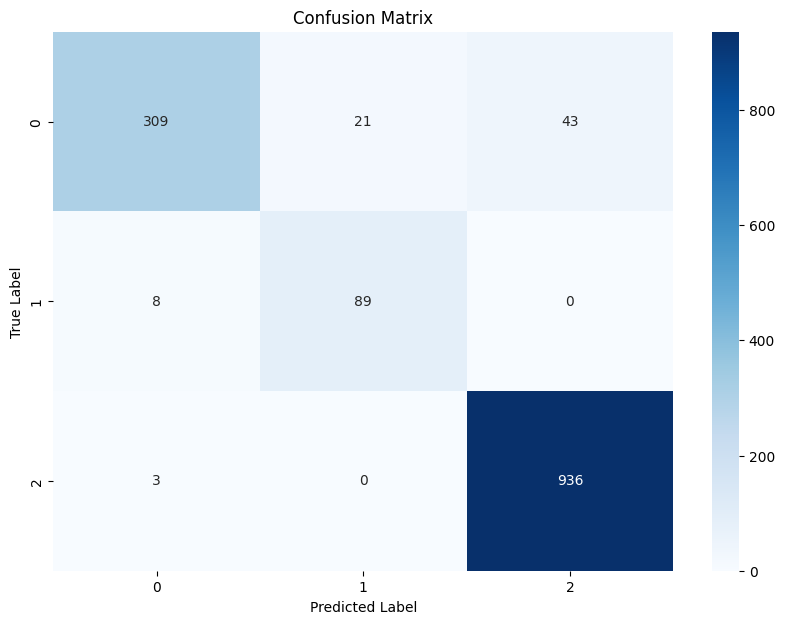

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### XGBoost

In [ ]:
# Building the model
clf_xgb = XGBClassifier(random_state=42)
clf_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
# Membuat prediksi pada X_test
pred = clf_xgb.predict(X_test)

# Menghitung metrik evaluasi
acc = accuracy_score(y_test, pred)  # Menghitung Accuracy
f1 = f1_score(y_test, pred, average='macro')  # Menghitung F1 Score (multiclass)
rec = recall_score(y_test, pred, average='macro')  # Menghitung Recall (multiclass)
prec = precision_score(y_test, pred, average='macro')  # Menghitung Precision (multiclass)
cm_xgb = confusion_matrix(y_test, pred)  # Menghitung Confusion Matrix

# Menyimpan hasil evaluasi dalam DataFrame
model_results = pd.DataFrame([['XGBoost', acc, f1, rec, prec]],
                             columns=['Model', 'Accuracy_Score', 'F1_Score', 'Recall_Score', 'Precision_Score'])

# Menggabungkan hasil evaluasi ke dalam DataFrame `results`
results = pd.concat([results, model_results], ignore_index=True)

# Menampilkan hasil
results

,Model,Accuracy_Score,F1_Score,Recall_Score,Precision_Score
0,LGBM,0.951739,0.914557,0.923587,0.911283
1,Random Forest,0.946771,0.909232,0.914250,0.910265
2,XGBoost,0.946771,0.908588,0.917482,0.904443


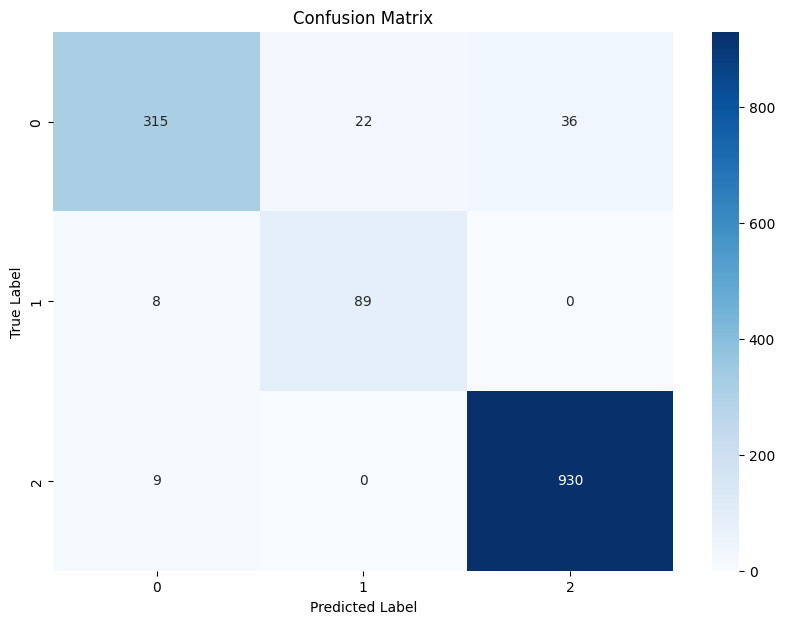

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### SVM

In [ ]:
# Building the model
clf_svm = SVC(random_state=42)
clf_svm.fit(X_train, y_train)

SVC(random_state=42)

In [ ]:
# Making predictions on X_test
pred = clf_svm.predict(X_test)

# Calculating evaluation metrics
acc = accuracy_score(y_test, pred)  # Calculating Accuracy
f1 = f1_score(y_test, pred, average='macro')  # Calculating F1 Score (multiclass)
rec = recall_score(y_test, pred, average='macro')  # Calculating Recall (multiclass)
prec = precision_score(y_test, pred, average='macro')  # Calculating Precision (multiclass)
cm_svm = confusion_matrix(y_test, pred)  # Calculating Confusion Matrix

# Storing evaluation results in a DataFrame
model_results = pd.DataFrame([['SVM', acc, f1, rec, prec]],
                             columns=['Model', 'Accuracy_Score', 'F1_Score', 'Recall_Score', 'Precision_Score'])

# Combining evaluation results into the `results` DataFrame
results = pd.concat([results, model_results], ignore_index=True)

# Displaying the results
results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Model,Accuracy_Score,F1_Score,Recall_Score,Precision_Score
0,LGBM,0.951739,0.914557,0.923587,0.911283
1,Random Forest,0.946771,0.909232,0.914250,0.910265
2,XGBoost,0.946771,0.908588,0.917482,0.904443
3,SVM,0.666430,0.266610,0.333333,0.222143


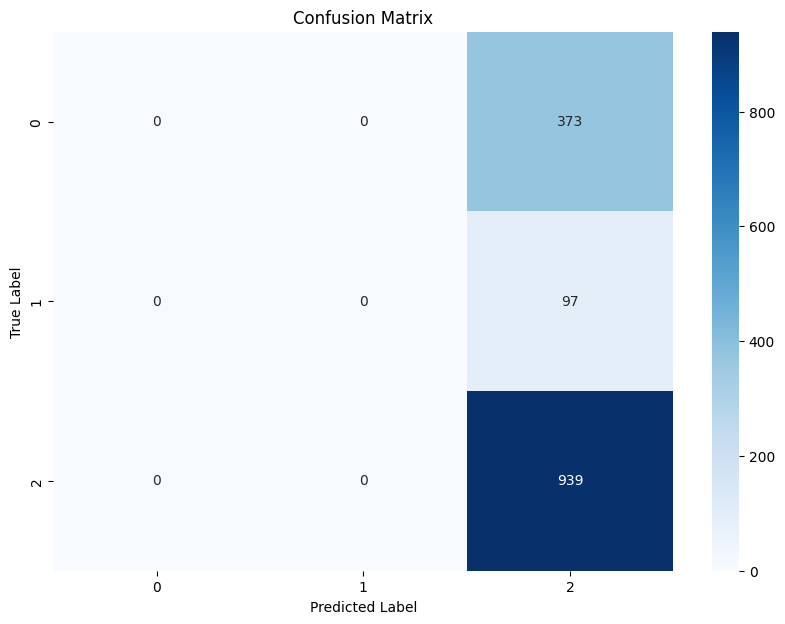

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Hyperparameter

Berdasarkan basemodel yang sudah didapatkan, model lgbm menjadi yang paling akurat sehingga model ini dipilih untuk dilakukan hyperparameter dengan optuna

In [ ]:
# Fungsi objective untuk Optuna
def objective(trial):
    # Membuat hyperparameter yang akan dioptimalkan oleh Optuna
    param = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'boosting_type': 'gbdt',
        'num_class': len(np.unique(y)),  # Jumlah kelas dalam target
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 100),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }

    # Membuat model LightGBM
    model = lgb.LGBMClassifier(**param)

    # Melatih model
    model.fit(X_train, y_train)

    # Membuat prediksi pada validation set
    y_pred = model.predict(X_test)

    # Menghitung akurasi
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

In [ ]:
# Membuat study untuk optimasi
study = optuna.create_study(direction='maximize')  # Arahkan untuk memaksimalkan akurasi
study.optimize(objective, n_trials=100)  # Cobalah 50 percobaan (bisa disesuaikan)

# Menampilkan hasil terbaik
print("Best hyperparameters: ", study.best_params)

[I 2024-10-04 09:50:25,840] A new study created in memory with name: no-name-92979352-a74c-42cd-a837-a2d04d56e63c


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-10-04 09:50:33,674] Trial 0 finished with value: 0.9467707594038325 and parameters: {'learning_rate': 0.046072317620556025, 'num_leaves': 52, 'max_depth': 7, 'n_estimators': 917, 'min_child_samples': 37, 'subsample': 0.9227999560219966, 'colsample_bytree': 0.6411527197187277}. Best is trial 0 with value: 0.9467707594038325.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:36,863] Trial 1 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.026042339476009528, 'num_leaves': 98, 'max_depth': 8, 'n_estimators': 225, 'min_child_samples': 44, 'subsample': 0.7856998046244027, 'colsample_bytree': 0.6752163284161787}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:40,928] Trial 2 finished with value: 0.9410929737402413 and parameters: {'learning_rate': 0.001505361886123063, 'num_leaves': 137, 'max_depth': 6, 'n_estimators': 462, 'min_child_samples': 65, 'subsample': 0.5247013214512075, 'colsample_bytree': 0.7952846106603126}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:42,794] Trial 3 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.003847819669989297, 'num_leaves': 63, 'max_depth': 3, 'n_estimators': 335, 'min_child_samples': 54, 'subsample': 0.977119048571347, 'colsample_bytree': 0.577934892178084}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-04 09:50:44,683] Trial 4 finished with value: 0.9496096522356281 and parameters: {'learning_rate': 0.0637987740188844, 'num_leaves': 34, 'max_depth': 3, 'n_estimators': 446, 'min_child_samples': 27, 'subsample': 0.9658979711623141, 'colsample_bytree': 0.9340658720583541}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:46,742] Trial 5 finished with value: 0.6664300922640171 and parameters: {'learning_rate': 0.00027990851411707025, 'num_leaves': 73, 'max_depth': 9, 'n_estimators': 210, 'min_child_samples': 74, 'subsample': 0.8083856605052336, 'colsample_bytree': 0.697007903951874}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:51,971] Trial 6 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.023406383647266195, 'num_leaves': 33, 'max_depth': 9, 'n_estimators': 581, 'min_child_samples': 33, 'subsample': 0.5912353391772597, 'colsample_bytree': 0.6076476957924075}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:50:57,693] Trial 7 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.018223494281604274, 'num_leaves': 82, 'max_depth': 5, 'n_estimators': 929, 'min_child_samples': 83, 'subsample': 0.8779492243905964, 'colsample_bytree': 0.9775825186327238}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:04,853] Trial 8 finished with value: 0.9474804826117814 and parameters: {'learning_rate': 0.04425708318775132, 'num_leaves': 117, 'max_depth': 9, 'n_estimators': 580, 'min_child_samples': 67, 'subsample': 0.6882034586445882, 'colsample_bytree': 0.9742161480283957}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:06,224] Trial 9 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.007539328125491258, 'num_leaves': 78, 'max_depth': 3, 'n_estimators': 206, 'min_child_samples': 60, 'subsample': 0.9729360794952789, 'colsample_bytree': 0.5416729607335864}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-04 09:51:13,062] Trial 10 finished with value: 0.8800567778566359 and parameters: {'learning_rate': 0.000636975408994301, 'num_leaves': 104, 'max_depth': 11, 'n_estimators': 713, 'min_child_samples': 100, 'subsample': 0.692939110849333, 'colsample_bytree': 0.8097719213873819}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2024-10-04 09:51:13,825] Trial 11 finished with value: 0.950319375443577 and parameters: {'learning_rate': 0.07597617786581817, 'num_leaves': 22, 'max_depth': 12, 'n_estimators': 104, 'min_child_samples': 20, 'subsample': 0.7972363253222229, 'colsample_bytree': 0.8619750565681806}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:15,665] Trial 12 finished with value: 0.950319375443577 and parameters: {'learning_rate': 0.09826552042625042, 'num_leaves': 105, 'max_depth': 12, 'n_estimators': 105, 'min_child_samples': 21, 'subsample': 0.8117634403994721, 'colsample_bytree': 0.8701878996962198}. Best is trial 1 with value: 0.9517388218594748.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:18,403] Trial 13 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.012507994628793427, 'num_leaves': 131, 'max_depth': 11, 'n_estimators': 120, 'min_child_samples': 44, 'subsample': 0.7592422883953691, 'colsample_bytree': 0.7398277587364102}. Best is trial 13 with value: 0.9524485450674237.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:22,961] Trial 14 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.009567860984618025, 'num_leaves': 142, 'max_depth': 10, 'n_estimators': 298, 'min_child_samples': 44, 'subsample': 0.7160100807914496, 'colsample_bytree': 0.6975365195297655}. Best is trial 14 with value: 0.9531582682753726.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:27,426] Trial 15 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.006289563760204207, 'num_leaves': 142, 'max_depth': 10, 'n_estimators': 338, 'min_child_samples': 48, 'subsample': 0.6750510232142707, 'colsample_bytree': 0.7381962459585046}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:33,780] Trial 16 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.0034813084099124102, 'num_leaves': 149, 'max_depth': 10, 'n_estimators': 365, 'min_child_samples': 51, 'subsample': 0.6697211457307835, 'colsample_bytree': 0.5035529872260718}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:44,596] Trial 17 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.001356481966057811, 'num_leaves': 150, 'max_depth': 10, 'n_estimators': 741, 'min_child_samples': 43, 'subsample': 0.6286600689274237, 'colsample_bytree': 0.7374143073660382}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:49,609] Trial 18 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.007080745715388839, 'num_leaves': 125, 'max_depth': 8, 'n_estimators': 380, 'min_child_samples': 51, 'subsample': 0.5520567442620015, 'colsample_bytree': 0.7929633864470085}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:53,257] Trial 19 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.005319380609231363, 'num_leaves': 126, 'max_depth': 7, 'n_estimators': 434, 'min_child_samples': 80, 'subsample': 0.5132648455837183, 'colsample_bytree': 0.8015264639118609}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:51:58,510] Trial 20 finished with value: 0.6664300922640171 and parameters: {'learning_rate': 0.00012856368018503988, 'num_leaves': 117, 'max_depth': 5, 'n_estimators': 707, 'min_child_samples': 54, 'subsample': 0.5786631150767834, 'colsample_bytree': 0.8625757210174734}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-10-04 09:52:03,604] Trial 21 finished with value: 0.9545777146912704 and parameters: {'learning_rate': 0.009329778032180831, 'num_leaves': 140, 'max_depth': 8, 'n_estimators': 319, 'min_child_samples': 36, 'subsample': 0.7290556890419231, 'colsample_bytree': 0.701578912008936}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:07,040] Trial 22 finished with value: 0.9396735273243435 and parameters: {'learning_rate': 0.0022421003102319776, 'num_leaves': 123, 'max_depth': 8, 'n_estimators': 299, 'min_child_samples': 36, 'subsample': 0.6291979239277417, 'colsample_bytree': 0.7599286980967879}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:14,408] Trial 23 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.0057725278892815585, 'num_leaves': 135, 'max_depth': 8, 'n_estimators': 502, 'min_child_samples': 29, 'subsample': 0.5713041752168946, 'colsample_bytree': 0.6545765534840995}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:17,764] Trial 24 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.015075552429221716, 'num_leaves': 111, 'max_depth': 6, 'n_estimators': 373, 'min_child_samples': 49, 'subsample': 0.7355818462184094, 'colsample_bytree': 0.7314610375243327}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:20,641] Trial 25 finished with value: 0.6664300922640171 and parameters: {'learning_rate': 0.0007323730679956134, 'num_leaves': 90, 'max_depth': 9, 'n_estimators': 259, 'min_child_samples': 59, 'subsample': 0.6482201670999543, 'colsample_bytree': 0.7794347768981157}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:24,772] Trial 26 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.005971689060978186, 'num_leaves': 139, 'max_depth': 7, 'n_estimators': 396, 'min_child_samples': 38, 'subsample': 0.8634080512770026, 'colsample_bytree': 0.8332106391805013}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:30,855] Trial 27 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.0021005860913945176, 'num_leaves': 126, 'max_depth': 6, 'n_estimators': 504, 'min_child_samples': 58, 'subsample': 0.5513465522907057, 'colsample_bytree': 0.9179367564455246}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:45,483] Trial 28 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.010830883978423095, 'num_leaves': 143, 'max_depth': 11, 'n_estimators': 646, 'min_child_samples': 30, 'subsample': 0.7505283501811519, 'colsample_bytree': 0.6186605773668663}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:54,229] Trial 29 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.03650761119292265, 'num_leaves': 92, 'max_depth': 8, 'n_estimators': 845, 'min_child_samples': 38, 'subsample': 0.608595745552602, 'colsample_bytree': 0.7162787581972823}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:52:57,774] Trial 30 finished with value: 0.9332860184528035 and parameters: {'learning_rate': 0.0037938491526074767, 'num_leaves': 116, 'max_depth': 10, 'n_estimators': 170, 'min_child_samples': 49, 'subsample': 0.8577083346956629, 'colsample_bytree': 0.6557808660208484}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:05,697] Trial 31 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.006402546243374335, 'num_leaves': 133, 'max_depth': 8, 'n_estimators': 530, 'min_child_samples': 25, 'subsample': 0.5606523230728565, 'colsample_bytree': 0.660981057108483}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:09,577] Trial 32 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.007657783360817365, 'num_leaves': 131, 'max_depth': 8, 'n_estimators': 297, 'min_child_samples': 33, 'subsample': 0.5005654191929936, 'colsample_bytree': 0.687360898010786}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:16,093] Trial 33 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.023459121823839465, 'num_leaves': 143, 'max_depth': 7, 'n_estimators': 503, 'min_child_samples': 40, 'subsample': 0.6581058789293992, 'colsample_bytree': 0.6321326774531473}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:22,367] Trial 34 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.0027074845204035297, 'num_leaves': 135, 'max_depth': 9, 'n_estimators': 405, 'min_child_samples': 29, 'subsample': 0.5397966632080361, 'colsample_bytree': 0.7599655467896367}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:28,152] Trial 35 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.004728745795982052, 'num_leaves': 150, 'max_depth': 6, 'n_estimators': 468, 'min_child_samples': 68, 'subsample': 0.5958717035310914, 'colsample_bytree': 0.5905511710222626}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:30,465] Trial 36 finished with value: 0.8814762242725337 and parameters: {'learning_rate': 0.0014242070921031585, 'num_leaves': 61, 'max_depth': 5, 'n_estimators': 334, 'min_child_samples': 48, 'subsample': 0.6218516974864302, 'colsample_bytree': 0.7739326197782589}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:34,060] Trial 37 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.016474753562250064, 'num_leaves': 122, 'max_depth': 8, 'n_estimators': 240, 'min_child_samples': 24, 'subsample': 0.7228937034193882, 'colsample_bytree': 0.7093139579186666}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:43,193] Trial 38 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.03138524608151777, 'num_leaves': 103, 'max_depth': 7, 'n_estimators': 611, 'min_child_samples': 33, 'subsample': 0.7743491518915312, 'colsample_bytree': 0.6711243160654136}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:48,074] Trial 39 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.00954473535852411, 'num_leaves': 111, 'max_depth': 9, 'n_estimators': 325, 'min_child_samples': 54, 'subsample': 0.5729383826871715, 'colsample_bytree': 0.829155206042559}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:50,875] Trial 40 finished with value: 0.8126330731014905 and parameters: {'learning_rate': 0.0007363080833109567, 'num_leaves': 141, 'max_depth': 4, 'n_estimators': 446, 'min_child_samples': 35, 'subsample': 0.6872327055166466, 'colsample_bytree': 0.644229668561239}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:55,084] Trial 41 finished with value: 0.9545777146912704 and parameters: {'learning_rate': 0.01043388510257229, 'num_leaves': 112, 'max_depth': 9, 'n_estimators': 332, 'min_child_samples': 56, 'subsample': 0.5696672815301077, 'colsample_bytree': 0.8438610269230599}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:53:59,746] Trial 42 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.004290884529496839, 'num_leaves': 128, 'max_depth': 9, 'n_estimators': 263, 'min_child_samples': 63, 'subsample': 0.5331635573266286, 'colsample_bytree': 0.9048880092520902}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:02,090] Trial 43 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.020541417339087778, 'num_leaves': 137, 'max_depth': 8, 'n_estimators': 189, 'min_child_samples': 72, 'subsample': 0.5956178191619218, 'colsample_bytree': 0.8246141464384776}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:04,119] Trial 44 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.022944452984336394, 'num_leaves': 119, 'max_depth': 9, 'n_estimators': 167, 'min_child_samples': 71, 'subsample': 0.5997265904684846, 'colsample_bytree': 0.829436665082175}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:06,290] Trial 45 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.02070581669670005, 'num_leaves': 96, 'max_depth': 10, 'n_estimators': 170, 'min_child_samples': 72, 'subsample': 0.6454891735047675, 'colsample_bytree': 0.8906509235802508}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:08,189] Trial 46 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.055071829002783866, 'num_leaves': 119, 'max_depth': 9, 'n_estimators': 169, 'min_child_samples': 84, 'subsample': 0.6024952324438669, 'colsample_bytree': 0.8328132051122612}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:11,017] Trial 47 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.013697400151465755, 'num_leaves': 110, 'max_depth': 11, 'n_estimators': 206, 'min_child_samples': 75, 'subsample': 0.6820021727042473, 'colsample_bytree': 0.8476619167283743}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:14,661] Trial 48 finished with value: 0.950319375443577 and parameters: {'learning_rate': 0.02769105939984535, 'num_leaves': 72, 'max_depth': 11, 'n_estimators': 200, 'min_child_samples': 89, 'subsample': 0.6991195872082618, 'colsample_bytree': 0.944111009029027}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:17,776] Trial 49 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.013994880442842451, 'num_leaves': 145, 'max_depth': 12, 'n_estimators': 211, 'min_child_samples': 74, 'subsample': 0.6701296213807715, 'colsample_bytree': 0.8008223171179369}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:19,826] Trial 50 finished with value: 0.9467707594038325 and parameters: {'learning_rate': 0.05025123316478577, 'num_leaves': 138, 'max_depth': 11, 'n_estimators': 155, 'min_child_samples': 79, 'subsample': 0.7143584192203145, 'colsample_bytree': 0.8861470805481372}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:21,625] Trial 51 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.010011767112647642, 'num_leaves': 113, 'max_depth': 10, 'n_estimators': 134, 'min_child_samples': 64, 'subsample': 0.6714324360820428, 'colsample_bytree': 0.8457338204451924}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:24,738] Trial 52 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.019462662363602685, 'num_leaves': 109, 'max_depth': 9, 'n_estimators': 247, 'min_child_samples': 70, 'subsample': 0.9405805853121714, 'colsample_bytree': 0.8226313337813982}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:29,341] Trial 53 finished with value: 0.9474804826117814 and parameters: {'learning_rate': 0.038548326932639605, 'num_leaves': 102, 'max_depth': 10, 'n_estimators': 291, 'min_child_samples': 78, 'subsample': 0.6244575173299773, 'colsample_bytree': 0.8514521184602301}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:32,070] Trial 54 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.011689047549583453, 'num_leaves': 132, 'max_depth': 9, 'n_estimators': 198, 'min_child_samples': 90, 'subsample': 0.5877856971100279, 'colsample_bytree': 0.7794475227469602}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:48,331] Trial 55 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.008483129371694001, 'num_leaves': 120, 'max_depth': 11, 'n_estimators': 1000, 'min_child_samples': 65, 'subsample': 0.7371212570490635, 'colsample_bytree': 0.8135373060613362}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2024-10-04 09:54:51,239] Trial 56 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.015772464570773283, 'num_leaves': 43, 'max_depth': 12, 'n_estimators': 348, 'min_child_samples': 61, 'subsample': 0.6414511764192278, 'colsample_bytree': 0.8762090886945398}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:54,540] Trial 57 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.026512519711168192, 'num_leaves': 99, 'max_depth': 10, 'n_estimators': 270, 'min_child_samples': 75, 'subsample': 0.7784732573510361, 'colsample_bytree': 0.7236120137675431}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:57,936] Trial 58 finished with value: 0.9474804826117814 and parameters: {'learning_rate': 0.08538234207893085, 'num_leaves': 107, 'max_depth': 9, 'n_estimators': 218, 'min_child_samples': 55, 'subsample': 0.8267412831826655, 'colsample_bytree': 0.9422421787625743}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:54:59,695] Trial 59 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.011995617970355938, 'num_leaves': 128, 'max_depth': 8, 'n_estimators': 110, 'min_child_samples': 68, 'subsample': 0.7000722899456856, 'colsample_bytree': 0.7527459658595426}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:05,652] Trial 60 finished with value: 0.9488999290276792 and parameters: {'learning_rate': 0.020042200086123455, 'num_leaves': 137, 'max_depth': 11, 'n_estimators': 415, 'min_child_samples': 83, 'subsample': 0.6144486836939302, 'colsample_bytree': 0.8491846073250171}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:10,442] Trial 61 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.006949194473836512, 'num_leaves': 123, 'max_depth': 8, 'n_estimators': 374, 'min_child_samples': 56, 'subsample': 0.5495845575490942, 'colsample_bytree': 0.7812936324364845}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:15,326] Trial 62 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.008484952191823077, 'num_leaves': 146, 'max_depth': 8, 'n_estimators': 303, 'min_child_samples': 45, 'subsample': 0.9998681765997538, 'colsample_bytree': 0.7995632306535969}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:17,519] Trial 63 finished with value: 0.8843151171043293 and parameters: {'learning_rate': 0.0031745112331558038, 'num_leaves': 127, 'max_depth': 7, 'n_estimators': 147, 'min_child_samples': 52, 'subsample': 0.520054367744689, 'colsample_bytree': 0.7404641494064437}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:22,153] Trial 64 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.005220621630154727, 'num_leaves': 114, 'max_depth': 9, 'n_estimators': 322, 'min_child_samples': 47, 'subsample': 0.5618379254509283, 'colsample_bytree': 0.8642649597470246}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:27,385] Trial 65 finished with value: 0.9496096522356281 and parameters: {'learning_rate': 0.014395392578058011, 'num_leaves': 131, 'max_depth': 10, 'n_estimators': 370, 'min_child_samples': 61, 'subsample': 0.5844189981378083, 'colsample_bytree': 0.8176332594857089}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:31,105] Trial 66 finished with value: 0.9496096522356281 and parameters: {'learning_rate': 0.03320331434876159, 'num_leaves': 123, 'max_depth': 8, 'n_estimators': 225, 'min_child_samples': 57, 'subsample': 0.6820232342573022, 'colsample_bytree': 0.7897630381538127}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:34,569] Trial 67 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.006900063026915409, 'num_leaves': 85, 'max_depth': 7, 'n_estimators': 257, 'min_child_samples': 51, 'subsample': 0.6550560967410034, 'colsample_bytree': 0.7665306355633473}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:36,869] Trial 68 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.012343343861794767, 'num_leaves': 139, 'max_depth': 9, 'n_estimators': 185, 'min_child_samples': 71, 'subsample': 0.5009593140801301, 'colsample_bytree': 0.6936035112030922}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:43,490] Trial 69 finished with value: 0.9496096522356281 and parameters: {'learning_rate': 0.016990030179195936, 'num_leaves': 146, 'max_depth': 10, 'n_estimators': 401, 'min_child_samples': 43, 'subsample': 0.6029887121269341, 'colsample_bytree': 0.8423260762015417}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:47,844] Trial 70 finished with value: 0.9467707594038325 and parameters: {'learning_rate': 0.002641491722992118, 'num_leaves': 116, 'max_depth': 8, 'n_estimators': 281, 'min_child_samples': 76, 'subsample': 0.6381364336058442, 'colsample_bytree': 0.9104463088740844}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:55:54,952] Trial 71 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.0057526356417095985, 'num_leaves': 136, 'max_depth': 8, 'n_estimators': 470, 'min_child_samples': 30, 'subsample': 0.5684452397669161, 'colsample_bytree': 0.6719125312369757}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:07,162] Trial 72 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.0038344975104620104, 'num_leaves': 134, 'max_depth': 9, 'n_estimators': 579, 'min_child_samples': 27, 'subsample': 0.5502930536698359, 'colsample_bytree': 0.7463428332604751}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:13,081] Trial 73 finished with value: 0.950319375443577 and parameters: {'learning_rate': 0.009252923505127766, 'num_leaves': 129, 'max_depth': 7, 'n_estimators': 506, 'min_child_samples': 39, 'subsample': 0.5778147688020406, 'colsample_bytree': 0.7034111753148936}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:22,287] Trial 74 finished with value: 0.9545777146912704 and parameters: {'learning_rate': 0.007351015975049261, 'num_leaves': 141, 'max_depth': 8, 'n_estimators': 430, 'min_child_samples': 21, 'subsample': 0.5350547922239816, 'colsample_bytree': 0.5426234407043031}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:29,445] Trial 75 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.00746294563682776, 'num_leaves': 141, 'max_depth': 8, 'n_estimators': 433, 'min_child_samples': 23, 'subsample': 0.5251715494245296, 'colsample_bytree': 0.8098742107986033}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:35,014] Trial 76 finished with value: 0.6664300922640171 and parameters: {'learning_rate': 0.00010266526616823294, 'num_leaves': 146, 'max_depth': 7, 'n_estimators': 348, 'min_child_samples': 20, 'subsample': 0.537393085456236, 'colsample_bytree': 0.5976551545896324}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:40,351] Trial 77 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.02363498515616464, 'num_leaves': 150, 'max_depth': 9, 'n_estimators': 309, 'min_child_samples': 66, 'subsample': 0.5954879316646744, 'colsample_bytree': 0.5108017056800266}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:46,455] Trial 78 finished with value: 0.9517388218594748 and parameters: {'learning_rate': 0.004335152349398528, 'num_leaves': 126, 'max_depth': 10, 'n_estimators': 347, 'min_child_samples': 46, 'subsample': 0.7324615697118647, 'colsample_bytree': 0.5430721236407067}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:52,363] Trial 79 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.011036750816049528, 'num_leaves': 141, 'max_depth': 8, 'n_estimators': 388, 'min_child_samples': 82, 'subsample': 0.7517298608800702, 'colsample_bytree': 0.5659761432693494}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-10-04 09:56:57,255] Trial 80 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.013296817167584322, 'num_leaves': 134, 'max_depth': 9, 'n_estimators': 238, 'min_child_samples': 42, 'subsample': 0.5134397336876387, 'colsample_bytree': 0.87289221773252}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:56:59,488] Trial 81 finished with value: 0.950319375443577 and parameters: {'learning_rate': 0.014041907600497826, 'num_leaves': 134, 'max_depth': 9, 'n_estimators': 131, 'min_child_samples': 42, 'subsample': 0.5178683031517399, 'colsample_bytree': 0.8808038161941654}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:02,505] Trial 82 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.021283167444935882, 'num_leaves': 118, 'max_depth': 9, 'n_estimators': 183, 'min_child_samples': 41, 'subsample': 0.542212114576749, 'colsample_bytree': 0.9989634433196148}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:06,296] Trial 83 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.017395864177191453, 'num_leaves': 124, 'max_depth': 8, 'n_estimators': 228, 'min_child_samples': 52, 'subsample': 0.5072293318166565, 'colsample_bytree': 0.863972748805859}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:13,740] Trial 84 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.04261081584204495, 'num_leaves': 130, 'max_depth': 11, 'n_estimators': 315, 'min_child_samples': 49, 'subsample': 0.5609407568233338, 'colsample_bytree': 0.7897413247022962}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-10-04 09:57:20,291] Trial 85 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.00851989573635074, 'num_leaves': 138, 'max_depth': 10, 'n_estimators': 281, 'min_child_samples': 35, 'subsample': 0.5222885683918159, 'colsample_bytree': 0.8331403390412768}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:26,764] Trial 86 finished with value: 0.9545777146912704 and parameters: {'learning_rate': 0.008432240546724605, 'num_leaves': 143, 'max_depth': 10, 'n_estimators': 278, 'min_child_samples': 35, 'subsample': 0.5298858759532515, 'colsample_bytree': 0.9028722025535779}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:31,987] Trial 87 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.010428648922415613, 'num_leaves': 137, 'max_depth': 10, 'n_estimators': 244, 'min_child_samples': 32, 'subsample': 0.7106999926031529, 'colsample_bytree': 0.8361918479734616}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:36,716] Trial 88 finished with value: 0.9510290986515259 and parameters: {'learning_rate': 0.005056190926632861, 'num_leaves': 148, 'max_depth': 11, 'n_estimators': 238, 'min_child_samples': 36, 'subsample': 0.5152545957578353, 'colsample_bytree': 0.9198658695933939}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:41,785] Trial 89 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.02788541254292437, 'num_leaves': 139, 'max_depth': 10, 'n_estimators': 204, 'min_child_samples': 27, 'subsample': 0.7639140345828165, 'colsample_bytree': 0.8531332062301796}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2024-10-04 09:57:43,310] Trial 90 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.013236795910912954, 'num_leaves': 21, 'max_depth': 9, 'n_estimators': 154, 'min_child_samples': 38, 'subsample': 0.7970323409555224, 'colsample_bytree': 0.8251095667824074}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:49,378] Trial 91 finished with value: 0.9552874378992193 and parameters: {'learning_rate': 0.008142927091790868, 'num_leaves': 143, 'max_depth': 10, 'n_estimators': 280, 'min_child_samples': 32, 'subsample': 0.5311980150990132, 'colsample_bytree': 0.8943109057721251}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:54,436] Trial 92 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.005864993341810258, 'num_leaves': 143, 'max_depth': 10, 'n_estimators': 265, 'min_child_samples': 32, 'subsample': 0.5420626648413363, 'colsample_bytree': 0.8899834066018893}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:57:59,639] Trial 93 finished with value: 0.9538679914833215 and parameters: {'learning_rate': 0.007895285392598546, 'num_leaves': 134, 'max_depth': 11, 'n_estimators': 287, 'min_child_samples': 73, 'subsample': 0.5295464290322079, 'colsample_bytree': 0.8578963777324919}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:58:05,128] Trial 94 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.010536614272578022, 'num_leaves': 147, 'max_depth': 9, 'n_estimators': 325, 'min_child_samples': 70, 'subsample': 0.5642913340916362, 'colsample_bytree': 0.8916210674927162}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-10-04 09:58:12,955] Trial 95 finished with value: 0.9481902058197303 and parameters: {'learning_rate': 0.01754604242785842, 'num_leaves': 120, 'max_depth': 12, 'n_estimators': 343, 'min_child_samples': 40, 'subsample': 0.6143714926074777, 'colsample_bytree': 0.8396534753989453}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:58:18,326] Trial 96 finished with value: 0.9524485450674237 and parameters: {'learning_rate': 0.009366761665383432, 'num_leaves': 144, 'max_depth': 10, 'n_estimators': 176, 'min_child_samples': 22, 'subsample': 0.506567524176217, 'colsample_bytree': 0.8748762057806216}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:58:22,854] Trial 97 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.006675252657335188, 'num_leaves': 140, 'max_depth': 9, 'n_estimators': 222, 'min_child_samples': 27, 'subsample': 0.5779777050943781, 'colsample_bytree': 0.9277116808106941}. Best is trial 15 with value: 0.9552874378992193.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:58:26,401] Trial 98 finished with value: 0.9559971611071683 and parameters: {'learning_rate': 0.012701027197068579, 'num_leaves': 108, 'max_depth': 11, 'n_estimators': 249, 'min_child_samples': 77, 'subsample': 0.5498441301492917, 'colsample_bytree': 0.7279559900683892}. Best is trial 98 with value: 0.9559971611071683.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2546
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 36
[LightGBM] [Info] Start training from score -1.326025
[LightGBM] [Info] Start training from score -2.758839
[LightGBM] [Info] Start training from score -0.398831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[I 2024-10-04 09:58:29,842] Trial 99 finished with value: 0.9531582682753726 and parameters: {'learning_rate': 0.015065629847143455, 'num_leaves': 98, 'max_depth': 11, 'n_estimators': 200, 'min_child_samples': 77, 'subsample': 0.6604116769973062, 'colsample_bytree': 0.7256315286231356}. Best is trial 98 with value: 0.9559971611071683.


Best hyperparameters:  {'learning_rate': 0.012701027197068579, 'num_leaves': 108, 'max_depth': 11, 'n_estimators': 249, 'min_child_samples': 77, 'subsample': 0.5498441301492917, 'colsample_bytree': 0.7279559900683892}


Setelah dilakukan tuning, model mencapai akurasi sebesar 95.6%, yang hanya mengalami peningkatan kecil dibandingkan dengan baseline model. Dengan demikian, model masih perlu dikembangkan lebih lanjut, meskipun terdapat potensi terjadinya overfitting.

**Best hyperparameters:**  {'learning_rate': 0.012701027197068579, 'num_leaves': 108, 'max_depth': 11, 'n_estimators': 249, 'min_child_samples': 77, 'subsample': 0.5498441301492917, 'colsample_bytree': 0.7279559900683892}